## 1. Cleaning and Preparing Data

#### Use the library pandas as pd to create DataFrames. This project will heavily use the manipulation of DataFrames to load data and analysis of information.

In [1]:
import pandas as pd

# Read csv file and convert into a DataFrame
df = pd.read_csv('ECommerce_consumer behaviour.csv')

df

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,department_id,department,product_name
0,2425083,49125,1,2,18,NaN,17,1,0,13,pantry,baking ingredients
1,2425083,49125,1,2,18,NaN,91,2,0,16,dairy eggs,soy lactosefree
2,2425083,49125,1,2,18,NaN,36,3,0,16,dairy eggs,butter
3,2425083,49125,1,2,18,NaN,83,4,0,4,produce,fresh vegetables
4,2425083,49125,1,2,18,NaN,83,5,0,4,produce,fresh vegetables
...,...,...,...,...,...,...,...,...,...,...,...,...
2019496,3390742,199430,16,3,18,5.0,83,8,0,4,produce,fresh vegetables
2019497,458285,128787,42,2,19,3.0,115,1,1,7,beverages,water seltzer sparkling water
2019498,458285,128787,42,2,19,3.0,32,2,1,4,produce,packaged produce
2019499,458285,128787,42,2,19,3.0,32,3,1,4,produce,packaged produce


In [2]:
# Check for the number of unique product_name: we have 134 different products
unique_items = df['product_name'].nunique()
unique_items

134

In [3]:
# These are the names of all 134 items
df['product_name'].unique()

array(['baking ingredients', 'soy lactosefree', 'butter',
       'fresh vegetables', 'yogurt', 'canned meals beans',
       'poultry counter', 'ice cream ice', 'fresh fruits', 'milk',
       'packaged cheese', 'bread', 'tea', 'bakery desserts',
       'frozen breakfast', 'cereal', 'eggs', 'buns rolls', 'cream',
       'water seltzer sparkling water', 'pickled goods olives',
       'packaged poultry', 'other creams cheeses',
       'honeys syrups nectars', 'coffee', 'refrigerated',
       'energy granola bars', 'soft drinks', 'latino foods',
       'plates bowls cups flatware', 'paper goods', 'oral hygiene',
       'diapers wipes', 'food storage', 'nuts seeds dried fruit', 'soap',
       'packaged vegetables fruits', 'hot dogs bacon sausage',
       'lunch meat', 'chips pretzels', 'meat counter',
       'fresh dips tapenades', 'prepared soups salads', 'condiments',
       'juice nectars', 'canned fruit applesauce',
       'preserved dips spreads', 'packaged produce',
       'canned jarr

In [4]:
"""For the purpose of this project, remove unnecessary features. Only order_id and
product_name are necessary for this project. For other analysis of data, such as
individual customer preferences or department purchases, this can be done in a
separate project. Beginning from this feature selection, the goal is to reduce
computational strain on the system.
"""

df.drop(['user_id', 'order_number', 'order_dow', 'order_hour_of_day',
         'days_since_prior_order', 'product_id', 'add_to_cart_order',
         'reordered', 'department', 'department_id'], axis=1, inplace=True)

# Remove any rows with null to clean data and remove unnecessary entries
df.dropna(inplace=True)

# Check for any missing values in each variable:
df.isnull().sum()

df

,order_id,product_name
0,2425083,baking ingredients
1,2425083,soy lactosefree
2,2425083,butter
3,2425083,fresh vegetables
4,2425083,fresh vegetables
...,...,...
2019496,3390742,fresh vegetables
2019497,458285,water seltzer sparkling water
2019498,458285,packaged produce
2019499,458285,packaged produce


In [5]:
"""
For the purposes of Apriori algorithm and to ensure that the calculation for
confidence is not affected, there is a need to remove duplicates. For example,
if there are two same products in one order_ID, only keep the first one.
"""

df.drop_duplicates(subset=['order_id', 'product_name'], keep='first', inplace=True)
df

,order_id,product_name
0,2425083,baking ingredients
1,2425083,soy lactosefree
2,2425083,butter
3,2425083,fresh vegetables
6,2425083,yogurt
...,...,...
2019495,3390742,fresh fruits
2019496,3390742,fresh vegetables
2019497,458285,water seltzer sparkling water
2019498,458285,packaged produce


As seen above, if each transaction has multiple purchases of the same products, then it is reduced (only 1 is kept). Then there are now only 1,453,116 entries.

It is best to organise all orders organised in groups by order_id and then create a list of list of transactions. This list can later be iterated through.

In [6]:
transactions = df.groupby('order_id')['product_name'].apply(list).tolist()

# Generate the first few transactions to check:
print(transactions[0:19])

[['fresh fruits', 'fresh vegetables', 'fresh herbs', 'baby food formula', 'canned meals beans', 'cream', 'meat counter'], ['frozen meals', 'fresh dips tapenades', 'canned meals beans', 'chips pretzels', 'oils vinegars'], ['butter', 'other creams cheeses', 'poultry counter', 'fresh fruits', 'milk', 'spreads', 'fresh vegetables', 'packaged cheese', 'cream', 'yogurt'], ['nuts seeds dried fruit', 'packaged vegetables fruits', 'oils vinegars', 'fresh vegetables', 'frozen produce', 'fresh herbs'], ['canned jarred vegetables', 'packaged cheese', 'fresh vegetables', 'eggs', 'frozen produce', 'doughs gelatins bake mixes', 'fresh fruits', 'packaged vegetables fruits', 'cream', 'refrigerated'], ['seafood counter', 'soy lactosefree', 'packaged vegetables fruits', 'fresh fruits', 'canned meals beans', 'fresh vegetables'], ['coffee', 'milk', 'water seltzer sparkling water', 'paper goods', 'frozen juice'], ['fresh fruits', 'soy lactosefree', 'meat counter', 'packaged cheese', 'fresh vegetables', 'vit

In [7]:
# Just to check in a dataframe using get_dummies to convert categorical to numerical
# variables to visually check that all transactions are recorded correctly.

check_table = pd.get_dummies(pd.DataFrame(transactions).stack()).groupby(level=0).sum()
check_table.head(20)

,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


## 2. Loading Data

#### Calculating Support, Confidence and Lifts of Paired Products (Frequent Itemset)

In [8]:
# Preparing to calculate support: all_transactions will be used many times
# which is the total number of unique transactions (200,000).

all_transactions = len(transactions)
all_transactions

200000

In [9]:
"""
We can now create a for loop iteration to calculate the support for each individual product.
This is first done by creating a dictionary on how many occurences happen with each item.
The dictionary 'product_quantity' shows how many times each product occurs.

Then we calculate the support (probability) of the product occuring by dividing the quantity
of each product by all_transactions. Loop through this calculation with 'for'. These support
numbers will then be stored in another dictionary support_single, which will then be converted
into a DataFrame for further process.
"""

# Define dictionary to store product quantities
product_quantity = {}

# Loop through each item in each transaction and add counter
for transaction in transactions:
    for product in transaction:
        if product in product_quantity:
            product_quantity[product] += 1
        else:
            product_quantity[product] = 1

# Calculate support for each product and organise into a new
# dictionary 'support_single'. Then convert to DataFrame.
support_single = {'Product': [], 'Support': []}

for product, quantity in product_quantity.items():
    support1 = quantity / all_transactions
    support_single['Product'].append(product)
    support_single['Support'].append(support1)

# Then create a DataFrame and sort by descending order
df_support1 = pd.DataFrame(support_single)
df_support1.sort_values(by='Support', ascending=False, inplace=True)

df_support1.head(30)

,Product,Support
0,fresh fruits,0.555995
1,fresh vegetables,0.444360
19,packaged vegetables fruits,0.365415
17,yogurt,0.263675
14,milk,0.243325
16,packaged cheese,0.230995
28,water seltzer sparkling water,0.193005
9,chips pretzels,0.169435
26,soy lactosefree,0.168355
46,bread,0.163865


The highest 30 items' support are given. At this point, the minimum support threshold needs to be considered. For the purposes of this project, the minimum support threshold considered should be 0.01. Therefore, we consider frequent itemsets that will have min_support_threshold >= 0.01.

In [10]:
'''
The same principle above can be used to find the support for
pairs of products. Although we need to first pair up products
by using a dictionary method 'pair_quantity'.
'''

# Define dictionary to store quantities of pairs of products
# The 'pair_quantity' will be used in subsequent codes
pair_quantity = {}

'''
One obstacle I had to go through is how to combine pairs of
items. I decided on pairing products and count occurrences
using the function 'combinations' from 'itertools' library.
This function combines all pairs possible by iterating through transactions
and then these pairs of items are sorted.
'''

from itertools import combinations

for transaction in transactions:
    pairs = list(combinations(transaction, 2))  # Generate all possible pairs
    for pair in pairs:
        pair = tuple(sorted(pair))  # So that (A, B) and (B, A) are the same pair and not duplicated
        if pair in pair_quantity:
            pair_quantity[pair] += 1
        else:
            pair_quantity[pair] = 1

# Calculate support for product pairs and organise into a new
# dictionary 'support_pair'. Then convert to DataFrame.
support_pair = {'Pair': [], 'Support': []}

for pair, quantity2 in pair_quantity.items():
    support2 = quantity2 / all_transactions
    support_pair['Pair'].append(pair)
    support_pair['Support'].append(support2)
    
# Then create a DataFrame and sort by descending order
df_support2 = pd.DataFrame(support_pair)

'''
This is a problem I encountered after completing the first run through of the .ipynb file:
The problem later with having (A, B) and (B, A) as the same pair is that the Confidence values can
be affected. For support and lift calculations, the order does not matter (combination). But for
confidence, the order matters. Confidence(Product1 -> Product2) is different to Confidence(Product2 ->
Product1), but I still need to have a value of support between two different tuples in the itemset.
For example, (eggs, yogurt) has the same support as (yogurt, eggs), but different confidence.
The other issue here is that the heatmap functions in the last part of this file need to have both
ways. Hence, what I have decided to do is to duplicate the pair (.copy() below) and then reverse
the tuple. This was a very difficult Python exercise for me - more than mining the data itself!
'''
df_swapped = df_support2.copy()
df_swapped['Pair'] = [tuple(reversed(pair)) if isinstance(pair, tuple) else pair for pair in df_swapped['Pair']]

# Concatenate the first and swapped DataFrames
doubled_df = pd.concat([df_support2, df_swapped], ignore_index=True)

# This reassignment should make the variable assignment easier to follow
df_support2 = doubled_df

df_support2

,Pair,Support
0,"(fresh fruits, fresh vegetables)",0.317560
1,"(fresh fruits, fresh herbs)",0.070135
2,"(baby food formula, fresh fruits)",0.033810
3,"(canned meals beans, fresh fruits)",0.049890
4,"(cream, fresh fruits)",0.057010
...,...,...
17755,"(shave needs, indian foods)",0.000005
17756,"(red wines, bulk grains rice dried goods)",0.000005
17757,"(kosher foods, bulk dried fruits vegetables)",0.000005
17758,"(packaged seafood, baby bath body care)",0.000005


In [11]:
'''
Now that we have the support for pairs of data, we can then calculate the confidence of each pair.
First confidence has the probability of 'antecedent' and 'consequent'. Confidence(antecedent -> consequent)
For example if we are calculating Confidence(milk -> yogurt), this means that the likeliness of occurence
of yogurt, given that milk has already occured. To calculate this:
Confidence(milk->yogurt) = Support(Milk & Yogurt)/Support(Milk)

Here the antecedent is 'ant' and the consequent is 'con'.

The below dictionary is a method I had to research, where the dictionary item_number 'retrieves' the item from the set
of transactions by using .get(item, 0) and then adds the number by 1 every time it counters the item. The '0' argument
is a default value if the item is not found in the set.
'''

# Using set avoids 'list' which iterates through every
# element thus making the calculation faster
item_number = {}
for transaction in transactions:
    for item in set(transaction):
        item_number[item] = item_number.get(item, 0) + 1     

# Pairing two items as a frequent itemset, but also making sure that it goes both ways
# Not the best pairing way, as ant, con is reversed to con, ant. But it is the only
# way I can think. This took me a very long time to do!
# Allow pair and reverse_pair to exist, and then these will be assigned to the
# pair_confidence dictionary.
pair_quantity = {}
for transaction in transactions:
    for i, item in enumerate(transaction):
        for j in range(i + 1, len(transaction)):
            pair = (item, transaction[j])
            reverse_pair = (transaction[j], item)    # Reverse the pair
            pair_quantity[pair] = pair_quantity.get(pair, 0) + 1
            pair_quantity[reverse_pair] = pair_quantity.get(reverse_pair, 0) + 1  # Add reverse pair

pair_confidence = {'Pair':[], 'Confidence(ant, con)': [], 'Confidence(con, ant)': []}

# Pair all and count how many antecedents and consequents (both ways!)
for pair, quantity in pair_quantity.items():
    ant, con = pair
    ant_count = item_number.get(ant, 0)
    con_count = item_number.get(con, 0)
    
    # Calculate confidence for both directions
    confidence_ant_con = quantity / ant_count if ant_count > 0 else 0
    confidence_con_ant = quantity / con_count if con_count > 0 else 0
    
    # Populate the dictionary pair_confidence by the previous calculation
    pair_confidence['Pair'].append(pair)
    pair_confidence['Confidence(ant, con)'].append(confidence_ant_con)
    pair_confidence['Confidence(con, ant)'].append(confidence_con_ant)

# Create a DataFrame of paired items' confidence values
df_confidence = pd.DataFrame(pair_confidence)
df_confidence.sort_values(by='Confidence(ant, con)', ascending=False, inplace=True)

# Remove the 'Confidence(con, ant)' column as this is a double up
df_confidence.drop('Confidence(con, ant)', axis=1, inplace=True)

# Rename the 'Confidence(ant, con)' column to 'Confidence'
df_confidence.rename(columns={'Confidence(ant, con)': 'Confidence'}, inplace=True)

df_confidence

,Pair,Confidence
13,"(fresh herbs, fresh vegetables)",0.845707
9611,"(bulk grains rice dried goods, fresh fruits)",0.785714
254,"(seafood counter, fresh vegetables)",0.769484
176,"(canned jarred vegetables, fresh vegetables)",0.765823
250,"(seafood counter, fresh fruits)",0.764544
...,...,...
16817,"(meat counter, facial care)",0.000458
17601,"(body lotions soap, bulk dried fruits vegetables)",0.000456
17462,"(plates bowls cups flatware, bulk grains rice ...",0.000443
17742,"(frozen breads doughs, specialty wines champag...",0.000412


In [12]:
'''
Next is to find the lift values of each pair. To calculate the value ofLift(X -> Y) the calculation is:
Lift = support(X and Y) / (support(X) * support(Y))
One obstacle here is to retrieve the support value of each product. I decided to calculate the support
in a for loop instead, hence making it localized calculations.

The pair_quantity variable assignment was already doubled when calculating Confidence above, so there is
no need to double the DataFrame again such as in Support.
'''

# Dictionary to store lift values of pairs of products
pair_lift_dict = {'Pair': [], 'Lift': []}

# Calculate lift for product pairs and organise into a new
# dictionary 'pair_lift_dict'. Then convert to DataFrame.
for pairlift, quantity in pair_quantity.items():
    product1, product2 = pairlift
    support_product1 = product_quantity[product1] / all_transactions    # Support(X)
    support_product2 = product_quantity[product2] / all_transactions    # Support(Y)
    support_pair2 = quantity / all_transactions    # Support(X and Y)
    lift = support_pair2 / (support_product1 * support_product2)    # Lift = Support(X and Y) / (Support(X) * Support(Y))
    pair_lift_dict['Pair'].append(pairlift)
    pair_lift_dict['Lift'].append(lift)

# Then create a DataFrame of lift and sort by descending order
df_lift = pd.DataFrame(pair_lift_dict)
df_lift.sort_values(by='Lift', ascending=False, inplace=True)
df_lift

,Pair,Lift
5922,"(red wines, white wines)",39.889759
5923,"(white wines, red wines)",39.889759
12491,"(specialty wines champagnes, red wines)",30.062282
12490,"(red wines, specialty wines champagnes)",30.062282
12497,"(white wines, specialty wines champagnes)",27.825571
...,...,...
17737,"(bulk grains rice dried goods, beers coolers)",0.102572
17600,"(bulk dried fruits vegetables, body lotions soap)",0.086609
17601,"(body lotions soap, bulk dried fruits vegetables)",0.086609
17462,"(plates bowls cups flatware, bulk grains rice ...",0.084356


In [13]:
# Check for all frequent itemset pairs with Lift more than 1
df_lift[df_lift['Lift'] > 1].count()

Pair    14634
Lift    14634
dtype: int64

In [14]:
# Check for all frequent itemset pairs with Lift more than 2
df_lift[df_lift['Lift'] > 2].count()

Pair    2312
Lift    2312
dtype: int64

#### Now that the values of support, confidence and lift of each possible pairs of items have been created, we combine all of them into one DataFrame. This data will then be further processed so that users can gather more insight.

In [15]:
# Combine DataFrames of support, confidence and lift together
# This is to compile all possible pairs' metrics, and this
# DataFrame will be used in various ways later.
not_full_df = pd.merge(df_support2, df_confidence, on='Pair', how='outer')
full_df = pd.merge(not_full_df, df_lift, on='Pair', how='outer')
full_df

,Pair,Support,Confidence,Lift
0,"(fresh fruits, fresh vegetables)",0.317560,0.571156,1.285346
1,"(fresh fruits, fresh herbs)",0.070135,0.126143,1.356306
2,"(baby food formula, fresh fruits)",0.033810,0.745453,1.340754
3,"(canned meals beans, fresh fruits)",0.049890,0.715731,1.287297
4,"(cream, fresh fruits)",0.057010,0.622346,1.119337
...,...,...,...,...
17755,"(shave needs, indian foods)",0.000005,0.001653,0.415822
17756,"(red wines, bulk grains rice dried goods)",0.000005,0.000646,0.123047
17757,"(kosher foods, bulk dried fruits vegetables)",0.000005,0.001553,0.294928
17758,"(packaged seafood, baby bath body care)",0.000005,0.000784,0.329285


Now that we have a DataFrame with all possible product pairs, we will begin to analyse the data for more information and insight. I began by plotting histograms and visualization of support-confidence (and lift) scatterplot graph.


## 3. Analysis and Visualization of Data Findings

###### Several analysis is conducted by finding histograms of Top 40 Products and Paired Products (Frequent Itemsets), Scatterplot of Support vs Confidence (with Lift), Top 5 Frequent Itemsets based on Support, Confidence and Lift, and finally Heatmaps of Frequent Itemsets based on Support, Confidence and Lift.


In [16]:
# One important initial analysis is to see the top 40 most purchased individual product
# (based on df_support1) and the visualization library plotly is used

import plotly.express as px

# Use .groupby to index 'Product' and retrieve support for each product
support_hist1 = df_support1.groupby('Product')['Support'].sum()

# Get the top 40 individual products by support and create DataFrame
topforty_prod = support_hist1.nlargest(40)
topforty_df = pd.DataFrame({'Product': topforty_prod.index, 'Support': topforty_prod.values})

# Interactive histogram
fig1 = px.bar(topforty_df, x='Product', y='Support', title='Histogram of Top 40 Products by Support')
fig1.update_xaxes(title='Product')
fig1.update_yaxes(title='Support')
fig1.update_layout(xaxis_tickangle=-60, height=600)  # Rotate x-axis labels
fig1.show()

In [17]:
'''
A confidence histogram can be done with the pairs of products, however, the 'Pair'
column data type is tuples. The method .groupby cannot read tuples, hence the
need to convert them to strings. The rest of the code is the same as previous.
'''

# Convert tuples in 'Pair' column to strings
df_confidence['Pair_String'] = df_confidence['Pair'].apply(', '.join)

# Use .groupby to index 'Pair_String' and calculate confidence for each product
confidence_hist2 = df_confidence.groupby('Pair_String')['Confidence'].sum()

# Get the top 40 pair of products by support and create DataFrame
topforty_pair = confidence_hist2.nlargest(40)
topforty_df2 = pd.DataFrame({'Pair_String': topforty_pair.index, 'Confidence': topforty_pair.values})

# Interactive histogram
fig2 = px.bar(topforty_df2, x='Pair_String', y='Confidence', title='Histogram of Top 40 Product Pairs by Confidence')
fig2.update_xaxes(title='Pair')
fig2.update_yaxes(title='Confidence')
fig2.update_layout(xaxis_tickangle=-60, height=600)  # Rotate x-axis labels
fig2.show()

Now we see the top 40 frequent itemsets by confidence. This is the preliminary results of looking at the data at face value. Further analysis is conducted as shown below.

In [18]:
'''
Another visualization useful in this analysis is a scatterplot between Support and Confidence values,
and show Lift. However, with 8880 entries, it is difficult to find any insights from Lift. As seen
below, most of the dot points are blue and hence, there is a need to adjust minimum support threshold
to make any meaning to the data.
'''

# Create scatterplot using Plotly
fig3 = px.scatter(full_df, x='Support', y='Confidence', color='Lift', title='Scatter Plot of Support vs Confidence',
                 labels={'X': 'Support', 'Y': 'Confidence', 'color':'Color Scale'},
                 color_continuous_scale='viridis',
                 hover_name='Pair')

# Layout settings
fig3.update_layout(
    title_font_size=20,
    title_font_family="Arial",
    title_x=0.5,  # Center title
    xaxis_title_font_size=16,
    yaxis_title_font_size=16,
    legend_title_font_size=14,
    plot_bgcolor='rgba(0,0,0,0)'
)

fig3.show()

This gives quite an interesting take as users can now hover on the scatterplot and see each pairs of products, together with the three metrics of support, confidence and lift. The problem here is the resolution: there are too many data to see differences. In addition, the Lift values that range from 0 to 40 does not help in this scatterplot as the majority of pairs of products have lower Lift values.

However, this scatterplot serves as a good initial model to be further modified. Since the problem is the resolution, it would serve users well to create a function to integrate minimum support threshold and minimum confidence threshold in order to limit the number of data in the scatterplot.

This requires an additional code just before the scatterplot code. Since the scatterplot takes in the full DataFrame 'full_df', then we will adjust the DataFrame that is fed into the scatter function to only a filtered portion of the 'full_df'. We can assign this name to 'new_df'. Then the scatterplot will be created based on the new DataFrame with data above the minimum support threshold and minimum confidence threshold.

In [19]:
def scatterplot_data():
    
    # Allow users to input minimum support and minimum confidence values to filter out data
    min_support_input = input("Enter the minimum support value or 'end' to exit: ")
    if min_support_input.lower() == 'end':
        print('Function ended.')
        return

    min_support = float(min_support_input)    # Allows for decimal values data type

    min_confidence_input = input("Enter the minimum confidence value or 'end' to exit: ")
    if min_confidence_input.lower() == 'end':
            print('Function ended.')
            return
    
    min_confidence = float(min_confidence_input)    # Allows for decimal values data type
    
    # Filter the DataFrame based on user inputs above, and assign data to a new DataFrame new_df
    new_df = full_df[(full_df['Support'] >= min_support) & (full_df['Confidence'] >= min_confidence)]
    
    # Create scatterplot using Plotly
    fig4 = px.scatter(new_df, x='Support', y='Confidence', color='Lift',
                      title=f'Scatter Plot of Support vs Confidence (Min Support: {min_support}, Min Confidence: {min_confidence})',
                     labels={'Support': 'Support', 'Confidence': 'Confidence', 'color': 'Color Scale'},
                     color_continuous_scale='viridis',
                     hover_name='Pair')
    
    # Layout settings
    fig4.update_layout(
        title_font_size=20,
        title_font_family="Arial",
        title_x=0.5,  # Center title
        xaxis_title_font_size=16,
        yaxis_title_font_size=16,
        legend_title_font_size=14,
        plot_bgcolor='rgba(0,0,0,0)'
    )
    
    # Show the plot
    fig4.show()

In [20]:
scatterplot_data()

Enter the minimum support value or 'end' to exit: 0.05
Enter the minimum confidence value or 'end' to exit: 0.2


Now this is clearly a better way to focus on the results. Most frequent itemsets do not work with too many data, but with the minimum support threshold and minimum confidene threshold options, users can explore the data and gain more insight to each frequent itemsets.

##### The new set new_df can be further iterated through the next step of the Apriori algorithm, but this is outside the scope of the project. Further research can be done to find the most frequent three-itemsets (triplets of products).

In [21]:
new_df = full_df[(full_df['Support'] >= 0.05) & (full_df['Confidence'] >= 0.1)]
new_df

,Pair,Support,Confidence,Lift
0,"(fresh fruits, fresh vegetables)",0.317560,0.571156,1.285346
1,"(fresh fruits, fresh herbs)",0.070135,0.126143,1.356306
4,"(cream, fresh fruits)",0.057010,0.622346,1.119337
6,"(fresh herbs, fresh vegetables)",0.078655,0.845707,1.903203
8,"(canned meals beans, fresh vegetables)",0.050435,0.723549,1.628295
...,...,...,...,...
9806,"(packaged vegetables fruits, lunch meat)",0.053225,0.145656,1.402024
9812,"(lunch meat, fresh vegetables)",0.060095,0.578448,1.301756
9948,"(ice cream ice, fresh vegetables)",0.051995,0.470500,1.058827
9950,"(fresh vegetables, crackers)",0.057335,0.129028,1.122278




I thought of another function that allows users to find the top 5 products that an item is associated with, based on their support, confidence and lift levels. A user can input the product_name, and the output will be shown in a DataFrame.

In [22]:
'''
Even though a list of tuples of paired products are easier to read, Python
would find it easier to compute if the tuples are separated into Product1
and Product2. This makes the next few codes easier instead of having to deal
with the inflexibility of tuples. The code below will update full_df to have
new columns Product1 and Product2.
'''

# Use the .tolist() method to convert the 'Pair' columns from Series to List
# Then use .index to so that the new DataFrame has the same index as the new one
# Add 'Product1' and 'Product2' columns based on the 'Pair' previously to the updated full_df
full_df[['Product1', 'Product2']] = pd.DataFrame(full_df['Pair'].tolist(), index=full_df.index)
full_df

,Pair,Support,Confidence,Lift,Product1,Product2
0,"(fresh fruits, fresh vegetables)",0.317560,0.571156,1.285346,fresh fruits,fresh vegetables
1,"(fresh fruits, fresh herbs)",0.070135,0.126143,1.356306,fresh fruits,fresh herbs
2,"(baby food formula, fresh fruits)",0.033810,0.745453,1.340754,baby food formula,fresh fruits
3,"(canned meals beans, fresh fruits)",0.049890,0.715731,1.287297,canned meals beans,fresh fruits
4,"(cream, fresh fruits)",0.057010,0.622346,1.119337,cream,fresh fruits
...,...,...,...,...,...,...
17755,"(shave needs, indian foods)",0.000005,0.001653,0.415822,shave needs,indian foods
17756,"(red wines, bulk grains rice dried goods)",0.000005,0.000646,0.123047,red wines,bulk grains rice dried goods
17757,"(kosher foods, bulk dried fruits vegetables)",0.000005,0.001553,0.294928,kosher foods,bulk dried fruits vegetables
17758,"(packaged seafood, baby bath body care)",0.000005,0.000784,0.329285,packaged seafood,baby bath body care


In [23]:
'''
This is a function with three functions inside, which calls the 5 top pairs of products
based on their support, confidence and lift. They use filters of DatFrames, and the method
.nlargest() to allow accessing product pairs between Product1 and Product2. The tuple list
'Pair' is still used for shorter display instead of 'Product1' and 'Product2'. The function
top_five() allows usersto input product_name and check the top 5 itemset with their metrics.
'''

def top_five():
    
    # Use .nlargest() to find the highest 5 support based on input_product
    def find_top_five_support(input_product):
        
        # Filter rows where user typed input_product is in 'Product1' or 'Product2'.
        # The operator '|' is for 'OR' which means the input_product could be Product1 or Product2
        paired_df = full_df[(full_df['Product1'] == input_product)]
        
        top_support = paired_df.nlargest(5, 'Support')
        top_support = top_support[['Pair', 'Support', 'Confidence', 'Lift']]

        return top_support
    
    # Use .nlargest() to find the highest 5 confidence based on input_product
    def find_top_five_confidence(input_product):
        
        paired_df = full_df[(full_df['Product1'] == input_product) | (full_df['Product2'] == input_product)]
        
        top_confidence = paired_df.nlargest(5, 'Confidence')
        top_confidence = top_confidence[['Pair', 'Support', 'Confidence', 'Lift']]

        return top_confidence
    
    # Use .nlargest() to find the highest 5 lift based on input_product
    def find_top_five_lift(input_product):
        
        paired_df = full_df[(full_df['Product1'] == input_product)]
        
        top_lift = paired_df.nlargest(5, 'Lift')
        top_lift = top_lift[['Pair', 'Support', 'Confidence', 'Lift']]

        return top_lift
    
    # User to enter input of product_name, and continue while loop by
    # calling the three functions above
    while True:
        input_product_name = input("Enter a product name (or 'end' to stop): ")
        
        if input_product_name.lower() == 'end':
            print("Function ended.")
            break
        
        # Call the three functions to create three DataFrames based on the input_product
        # .reset_index(drop=True) is included in displaying the DataFrames later.
        top_five_support = find_top_five_support(input_product_name).reset_index(drop=True)
        top_five_confidence = find_top_five_confidence(input_product_name).reset_index(drop=True)
        top_five_lift = find_top_five_lift(input_product_name).reset_index(drop=True)
        
        # Print all restuls with heading, and use display to display the three DataFrames
        print(f'\nThe top five pairs for {input_product_name} based on support:')
        display(top_five_support[['Pair', 'Support', 'Confidence', 'Lift']])
        
        print(f'\nThe top five pairs for {input_product_name} based on confidence:')
        display(top_five_confidence[['Pair', 'Support', 'Confidence', 'Lift']])
        
        print(f'\nThe top five pairs for {input_product_name} based on lift:')
        display(top_five_lift[['Pair', 'Support', 'Confidence', 'Lift']])
        
        return

In [24]:
top_five()

Enter a product name (or 'end' to stop): yogurt

The top five pairs for yogurt based on support:


,Pair,Support,Confidence,Lift
0,"(yogurt, fresh fruits)",0.188225,0.713852,1.283919
1,"(yogurt, fresh vegetables)",0.144660,0.548630,1.234652
2,"(yogurt, packaged vegetables fruits)",0.127910,0.485105,1.327545
3,"(yogurt, milk)",0.095705,0.362966,1.491691
4,"(yogurt, packaged cheese)",0.088520,0.335716,1.453349



The top five pairs for yogurt based on confidence:


,Pair,Support,Confidence,Lift
0,"(yogurt, fresh fruits)",0.188225,0.713852,1.283919
1,"(granola, yogurt)",0.015730,0.558792,2.119246
2,"(yogurt, fresh vegetables)",0.144660,0.548630,1.234652
3,"(yogurt, packaged vegetables fruits)",0.127910,0.485105,1.327545
4,"(baby food formula, yogurt)",0.021520,0.474479,1.799485



The top five pairs for yogurt based on lift:


,Pair,Support,Confidence,Lift
0,"(yogurt, granola)",0.01573,0.059657,2.119246
1,"(yogurt, baby food formula)",0.02152,0.081616,1.799485
2,"(yogurt, canned fruit applesauce)",0.01117,0.042363,1.753425
3,"(yogurt, frozen breakfast)",0.02578,0.097772,1.598494
4,"(yogurt, refrigerated pudding desserts)",0.00424,0.016080,1.574966


A final part of the design of this data mining code is to provide a heatmap visualization between products and their available pairs. The following codes use the visualization library seaborn and matplotlib, using the sns.heatmap() function to analyze the data and create a heatmap. 

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

def heatmap_support(input_words):
    
    # Filter the data based on input words in 'Product1'
    product1_data_support = full_df[full_df['Product1'].isin(input_words)]
    
    # Pivot the data to get a matrix of support values
    support_heatmap_data = product1_data_support.pivot(index='Product2', columns='Product1', values='Support')
    
    # Create the heatmap
    plt.figure(figsize=(16, 32))
    heatmap = sns.heatmap(support_heatmap_data, cmap='Oranges', annot=True, fmt=".2f")
    heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=10)    # Adjust font size of Product2
    heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=10)    # Adjust font size of Product1
    plt.title('Support Heatmap')
    plt.xlabel('Product1')
    plt.ylabel('Product2')
    plt.show()

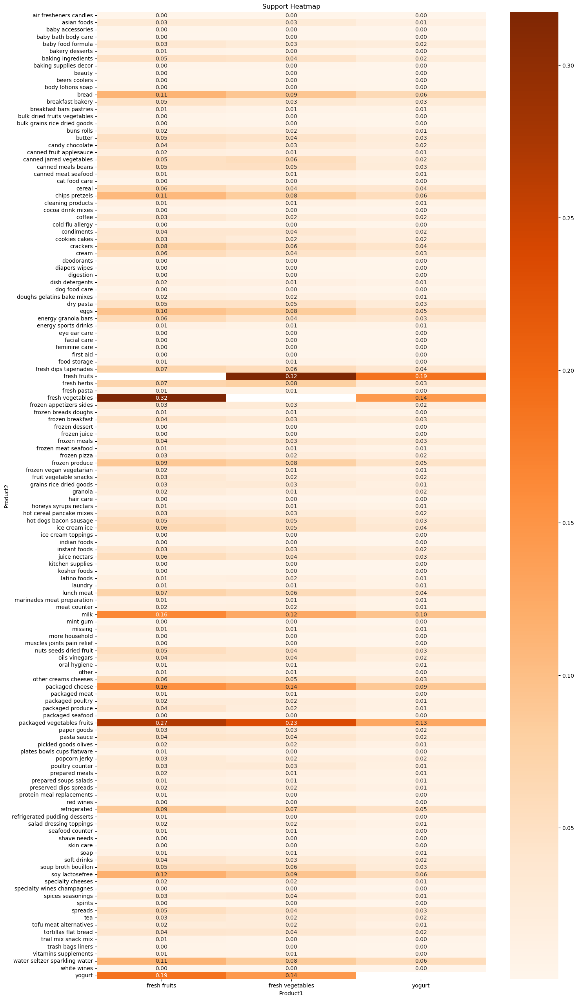

In [26]:
# Generate input_words list to enter into the heatmap code

input_words = ['fresh fruits', 'fresh vegetables', 'yogurt']
heatmap_support(input_words)

In [27]:
def heatmap_confidence(input_words):
    
    product1_data_confidence = full_df[full_df['Product1'].isin(input_words)]
    
    # Pivot for confidence matrix data
    confidence_heatmap_data = product1_data_confidence.pivot(index='Product2', columns='Product1', values='Confidence')
    
    plt.figure(figsize=(16, 32))
    heatmap = sns.heatmap(confidence_heatmap_data, cmap='Blues', annot=True, fmt=".2f")
    heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=10)
    heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=10)
    plt.title('Confidence Heatmap')
    plt.xlabel('Product1')
    plt.ylabel('Product2')
    plt.show()

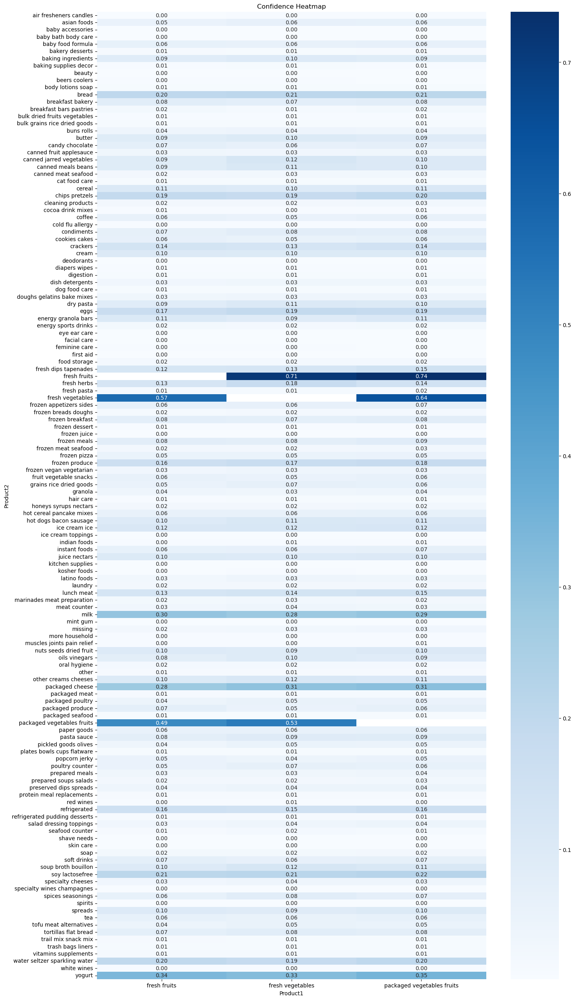

In [28]:
input_words = ['fresh fruits', 'fresh vegetables', 'packaged vegetables fruits']
heatmap_confidence(input_words)

In [29]:
def heatmap_lift(input_words):
    
    product1_data_lift = full_df[full_df['Product1'].isin(input_words)]
    
    # Lift matrix data
    lift_heatmap_data = product1_data_lift.pivot(index='Product2', columns='Product1', values='Lift')
    
    plt.figure(figsize=(16, 32))
    heatmap = sns.heatmap(lift_heatmap_data, cmap='Greens', annot=True, fmt=".2f")
    heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=10)
    heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=10)
    plt.title('Lift Heatmap')
    plt.xlabel('Product1')
    plt.ylabel('Product2')
    plt.show()

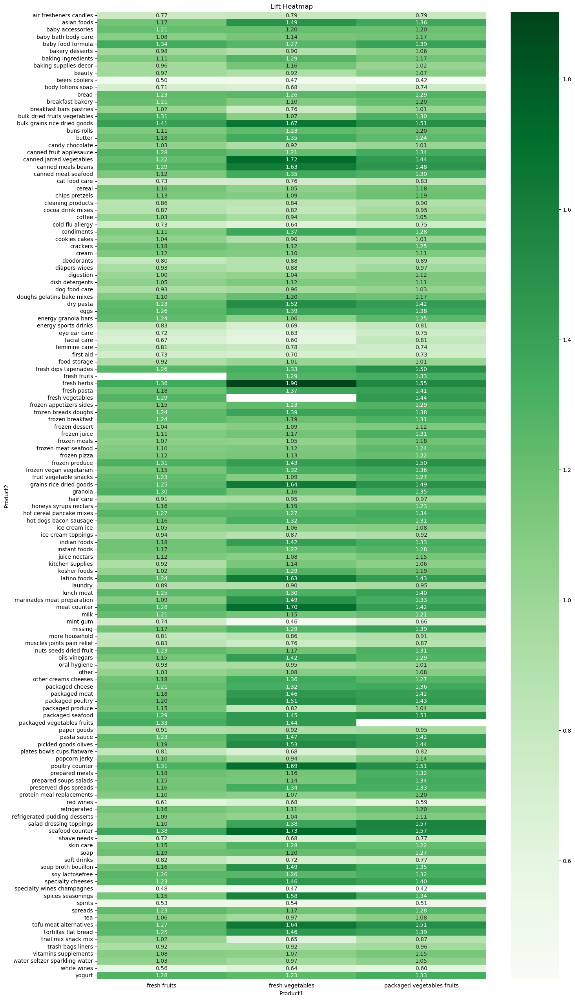

In [30]:
input_words = ['fresh fruits', 'fresh vegetables', 'packaged vegetables fruits']
heatmap_lift(input_words)

There are many other ways association rules can be created and modeled, such as node networks and parallel cateogires plot, however, this may be further researched in other opportunities. Another further work that can be done in this study is to find the association rule of a frequent two-itemset into a frequent three-itemset. For example, Support{Product1 -> Product2 & Product3}, based on the new_df DataFrame. However, due to the limitations of time, together with programming and computational complexity, these are ommitted from the current project. Hence, more information can be mined in the future.

Analysis of findings, results and discussions are written on the project report.

As a reminder, there are a number of useful input and functions that will be useful for a user to analyse the data:

1. fig1.show(): Top 40 Inidividual Product by Support
2. fig2.show(): Top 40 Paired Products by Support (Frequent Itemsets)
3. fig3.show(): Support vs Confidence (with Lift) of All Transactions (Frequent Itemsets)
4. scatterplot_data(): Enter min support & confidence threshold to filter Support vs Confidence 
5. top_five(): Enter product_name to find the top five paired product based on the metrics
6. heatmap_support('input_words'): Heatmap of support of paired products to 'Product1'
7. heatmap_confidence('input_words'): Heatmap of confidence of paired products to 'Product1'
8. heatmap_lift('input_words'): Heatmap of lift of paired products to 'Product1'

These codes can be further edited to further mine information from the dataset. Edit codes accordingly to suit the needs of a data mining exercise.